## **Notebook inspired by :** 

#### For graphs and visualization
 - **🩻 Aneurysm Atlas 🗺️ | Viz and EDA 🔍:** https://www.kaggle.com/code/tarundirector/aneurysm-atlas-viz-and-eda \
 - **Voxel by Voxel: 3D CNN Intracranial Aneurysms:** https://www.kaggle.com/code/ahsuna123/voxel-by-voxel-3d-cnn-intracranial-aneurysms/notebook \
 - **🧠 Aneurysm 3️⃣🇩 🇨 🇳 🇳** https//www.kaggle.com/code/taimour/aneurysm-3 

#### Interesting notebooks
 - **RSNA2025 - Preprocessing Guide**: https://www.kaggle.com/code/amirmmahdavikia/rsna2025-preprocessing-guide

# <span style="color:#ffffff; font-size: 1%;">I - Data Description</span>
### <span style="color:#ffffff; font-size: 1%;">EDA</span>

<div style=" border-bottom: 8px solid #1E88E5; overflow: hidden; border-radius: 10px; height: 45px; width: 100%; display: flex;">
  <div style="height: 100%; width: 100%; background-color: #E6F0FA; float: left; text-align: center; display: flex; justify-content: center; align-items: center; font-size: 25px; ">
    <b><span style="color:#1E88E5; padding: 20px 20px;"><strong>I - Data Description</strong></span></b>
  </div></div>

<br>
The competition data comprises several thousand expertly-curated medical imaging series of the brain from a variety of modalities, including CTA, MRA, and T1 post-contrast and T2-weighted MRI. The series have been labeled in thirteen locations for the presence of aneurysms. We include spatial localization labels for all aneurysms and vessel segmentations for a subset of the cases.

## <span style="color:#ffffff; font-size: 1%;">I.1 - File and Field Information</span>

<b><span style="color: #1E88E5; background-color: #E6F0FA; padding: 20px; font-size: 18px; border-left: 8px solid #1E88E5"> <strong>I.1 - File and Field Information</strong></span></b>

<br>

#### **1 - train.csv**
This file contains the primary training labels. Each row corresponds to a single image series. The other columns provide more granular labels for the location of any aneurysms as well as basic demographic data.

- `SeriesInstanceUID` - A unique identifier for each scan series.
- `Modality` - Identifies the mode of imaging: CTA, MRA, MRI, etc.
- `PatientAge` and `PatientSex` - Demographic data for the subject of the scan.
- Thirteen binary variables indicating presence of an aneurysm in this location. In all cases, 1 denotes the presence of an aneurysm and 0 denotes its absence.
    - `Left Infraclinoid Internal Carotid Artery`
    - `Right Infraclinoid Internal Carotid Artery`
    - `Left Supraclinoid Internal Carotid Artery`
    - `Right Supraclinoid Internal Carotid Artery`
    - `Left Middle Cerebral Artery`
    - `Right Middle Cerebral Artery`
    - `Anterior Communicating Artery`
    - `Left Anterior Cerebral Artery`
    - `Right Anterior Cerebral Artery`
    - `Left Posterior Communicating Artery`
    - `Right Posterior Communicating Artery`
    - `Basilar Tip`
    - `Other Posterior Circulation`
- `Aneurysm Present` - The main target variable, binary, indicating if an aneurysm is present anywhere in the scan.

> **Data Hierarchy Overview:**
> The dataset is organized at the **image series level** (`SeriesInstanceUID`). Each row contains a scan’s modality, patient demographic data, and 14 binary target labels representing the presence of aneurysms in specific vessel regions, including a global "Aneurysm Present" flag.
>
> Patient<br>
> └── `SeriesInstanceUID` (1 per DICOM scan)<br>
>   ├── `Modality`, `Age`, `Sex`<br>
>   ├── Aneurysm Present ✅<br>
>   └── Region-wise labels (13x binary targets)<br>

<br>

#### **2 - train_localizers.csv**
This file provides localization data for the aneurysms in the training set. For each aneurysm, it provides the specific image (SOPInstanceUID) and the coordinates near the aneurysm's center.

- `SeriesInstanceUID` - A unique identifier for each scan series, corresponding to that in train.csv.
- `SOPInstanceUID` - A unique identifier for a specific image within a series.
- `coordinates` - The xy-coordinates of the center of the aneurysm in the image.
- `location` - A text description of the aneurysm's location.

> Use this file to train slice-level localization models or augment classification with spatial priors.

<br>

#### **3 - 📂 series**
**series/** - Contains training-set DICOM series, with one series per folder. The filepaths have the form <br>`series/{SeriesInstanceUID}/{SOPInstanceUID}.dcm`.

> Each folder contains a full 3D brain scan (DICOM format). These scans vary in modality, resolution, and number of slices depending on the contributing institution and scanner.

<br>

#### **4 - 📂 segmentations**

Contains NifTI vessel segmentations for a subset of the DICOM series in 📂 `series`. The labels are described as follows:

   Label Value | Label                                      |
 |-------------|--------------------------------------------|
 | 1           | Other Posterior Circulation               |
 | 2           | Basilar Tip                                |
 | 3           | Right Posterior Communicating Artery      |
 | 4           | Left Posterior Communicating Artery       |
 | 5           | Right Infraclinoid Internal Carotid Artery|
 | 6           | Left Infraclinoid Internal Carotid Artery |
 | 7           | Right Supraclinoid Internal Carotid Artery|
 | 8           | Left Supraclinoid Internal Carotid Artery  |
 | 9           | Right Middle Cerebral Artery              |
 | 10          | Left Middle Cerebral Artery               |
 | 11          | Right Anterior Cerebral Artery           |
 | 12          | Left Anterior Cerebral Artery            |
 | 13          | Anterior Communicating Artery             |

 <br>


  
#### **5 - 📂 kaggle_evaluation**

Files used by the evaluation API. See the demo submission for an illustration of how to use the API. This API will serve the test set to your submission one series at a time, in unfixed random order. There are nearly 2500 series in the test set.
  

## <span style="color:#ffffff; font-size: 1%;">I.2 - Spatial and geometric properties of medical imaging</span>

<b><span style="color: #1E88E5; background-color: #E6F0FA; padding: 20px; font-size: 18px; border-left: 8px solid #1E88E5"> <strong>I.2 - Spatial and geometric properties of medical imaging</strong></span></b>

<br>

| Term                                         | Description                                                                               | Relevance to Modeling                                                                                                              |
| -------------------------------------------- | ----------------------------------------------------------------------------------------- | ---------------------------------------------------------------------------------------------------------------------------------- |
| **Modality**                                 | Imaging type (e.g. CTA, MRA, T1-post, T2-weighted MRI)                                    | Different contrasts → may require modality-specific preprocessing or separate models.                                              |
| **Rows & Columns**                           | Height (rows) and width (columns) of each 2D image (in pixels)                            | Determines input spatial resolution; affects network input size and memory.                                                        |
| **Pixel Spacing**                            | Physical distance between pixel centers in the image plane (mm)                           | Converts pixels → millimeters; critical for scale-invariant feature learning and for resampling to uniform voxel size.             |
| **Slice Thickness**                          | Distance between adjacent image slices (mm)                                               | Together with Pixel Spacing defines voxel anisotropy; informs whether to use 2D vs 3D networks or resample volumes.                |
| **Spacing Between Slices**                   | Exact inter-slice gap (mm)                                                                | More precise inter-slice spacing (when non-zero gap); needed to reconstruct accurate 3D volumes.                                   |
| **Number of Slices (Series Length)**         | Total count of images in a series (i.e. depth of the volume)                              | Defines the 3rd volume dimension; variable depth across patients → influences network architecture and memory planning.            |
| **Volume Dimensions**                        | (Rows × Columns × Number of Slices)                                                       | Full shape of 3D input tensor; guides layer/channel sizing in 3D CNNs.                                                             |
| **Voxel Spacing**                            | (Pixel Spacing × Pixel Spacing × Slice Thickness) in mm                                   | True size of each 3D voxel; used for isotropic resampling and normalization across studies.                                        |
| **Image Orientation (Patient)**              | 6-value vector defining row/column direction cosines in patient coordinate space          | Ensures consistent anatomical alignment across series; required for spatial normalization or atlas registration.                   |
| **Image Position (Patient)**                 | 3-value vector of the x,y,z coordinates of the first pixel in the image                   | Together with Orientation, places each slice correctly in 3D; used to sort slices and reconstruct volumes correctly.               |
| **Derived: Aspect Ratio**                    | Columns / Rows                                                                            | Useful for cropping/padding strategies to maintain anatomical proportions.                                                         |
| **Derived: Slice Anisotropy Ratio**          | Slice Thickness / Pixel Spacing                                                           | Quantifies how “stretched” the volume is in Z vs X/Y; drives choice of 2D vs 3D convolutions or interpolation schemes.             |
| **Derived: Physical Volume Size**            | (Rows·Pixel Spacing) × (Columns·Pixel Spacing) × (Number of Slices·Slice Thickness) (mm³) | Approximate head volume imaged; can help normalize for global intensity or shape features across subjects.                         |
| **Derived: Voxel Count**                     | Rows × Columns × Number of Slices                                                         | Total input elements; relevant for memory planning and for reporting model complexity (GFLOPs).                                    |
| **Derived: Total Scan Coverage**             | (Number of Slices × Slice Thickness) (mm)                                                 | Approximate anatomical coverage in superior–inferior direction; can be used to filter out incomplete studies or pad volumes.       |

# <span style="color:#ffffff; font-size: 1%;">II - Data Analysis</span>
### <span style="color:#ffffff; font-size: 1%;">EDA</span>

<div style=" border-bottom: 8px solid #1E88E5; overflow: hidden; border-radius: 10px; height: 45px; width: 100%; display: flex;">
  <div style="height: 100%; width: 100%; background-color: #E6F0FA; float: left; text-align: center; display: flex; justify-content: center; align-items: center; font-size: 25px; ">
    <b><span style="color:#1E88E5; padding: 20px 20px;"><strong>II - Data Analysis</strong></span></b>
  </div></div>

In [1]:
# Librairies
import os
import numpy as np
import pandas as pd
import ast
import random
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle
from glob import glob
import textwrap
import base64
from io import BytesIO
from IPython.display import HTML

# Medical image handling
import pydicom  # for reading DICOM files
import nibabel as nib  # for NIfTI files in segmentations
import cv2  # for basic image operations (optional)

# Warnings
import warnings
warnings.filterwarnings("ignore")

## <span style="color:#ffffff; font-size: 1%;">II.1 - Tables & Statistics</span>

<b><span style="color: #1E88E5; background-color: #E6F0FA; padding: 20px; font-size: 18px; border-left: 8px solid #1E88E5"> <strong>II.1 - Tables & Statistics</strong></span></b>

In [2]:
# Data Import
train_df = pd.read_csv("/kaggle/input/rsna-intracranial-aneurysm-detection/train.csv")
localizers_df = pd.read_csv("/kaggle/input/rsna-intracranial-aneurysm-detection/train_localizers.csv")

### **train_df (train.csv)**
Extract of **train_df** (*train.csv*) :

In [3]:
# Data Display
display(train_df.head(2))

# First Statistics
num_rows, num_cols = train_df.shape
print(f"\nNumber of Rows: {num_rows}")
print(f"Number of Columns: {num_cols}\n")

,SeriesInstanceUID,PatientAge,PatientSex,Modality,Left Infraclinoid Internal Carotid Artery,Right Infraclinoid Internal Carotid Artery,Left Supraclinoid Internal Carotid Artery,Right Supraclinoid Internal Carotid Artery,Left Middle Cerebral Artery,Right Middle Cerebral Artery,Anterior Communicating Artery,Left Anterior Cerebral Artery,Right Anterior Cerebral Artery,Left Posterior Communicating Artery,Right Posterior Communicating Artery,Basilar Tip,Other Posterior Circulation,Aneurysm Present
0,1.2.826.0.1.3680043.8.498.10004044428023505108...,64,Female,MRA,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1.2.826.0.1.3680043.8.498.10004684224894397679...,76,Female,MRA,0,0,0,0,0,0,0,0,0,0,0,0,0,0



Number of Rows: 4348
Number of Columns: 18



Statistics description of columns in **train_df** (*train.csv*):

In [4]:
def describe_numerical(df, name):
    cols = [col for col in df.columns]
    return df[cols].describe().T.style

display(describe_numerical(train_df, "train_df"))

,count,mean,std,min,25%,50%,75%,max
PatientAge,4348.000000,58.466881,15.841231,18.000000,48.000000,60.000000,70.000000,89.000000
Left Infraclinoid Internal Carotid Artery,4348.000000,0.017939,0.132746,0.000000,0.000000,0.000000,0.000000,1.000000
Right Infraclinoid Internal Carotid Artery,4348.000000,0.022539,0.148446,0.000000,0.000000,0.000000,0.000000,1.000000
Left Supraclinoid Internal Carotid Artery,4348.000000,0.075897,0.264864,0.000000,0.000000,0.000000,0.000000,1.000000
Right Supraclinoid Internal Carotid Artery,4348.000000,0.063937,0.244670,0.000000,0.000000,0.000000,0.000000,1.000000
Left Middle Cerebral Artery,4348.000000,0.050368,0.218728,0.000000,0.000000,0.000000,0.000000,1.000000
Right Middle Cerebral Artery,4348.000000,0.067617,0.251117,0.000000,0.000000,0.000000,0.000000,1.000000
Anterior Communicating Artery,4348.000000,0.083487,0.276648,0.000000,0.000000,0.000000,0.000000,1.000000
Left Anterior Cerebral Artery,4348.000000,0.010580,0.102323,0.000000,0.000000,0.000000,0.000000,1.000000
Right Anterior Cerebral Artery,4348.000000,0.012879,0.112768,0.000000,0.000000,0.000000,0.000000,1.000000


Check for missing values:

In [5]:
# Column-level summary for RSNA train_df
columns = train_df.columns.tolist()

# Missing value summary
missing_summary = pd.DataFrame({
    'Feature': columns,
    'Missing Count': train_df.isnull().sum().values,
    'Missing %': (train_df.isnull().sum().values / len(train_df)) * 100
})

# Unique value summary
unique_summary = pd.DataFrame({
    'Feature': columns,
    'Unique Values': train_df.nunique().values
})

# Data types
dtypes_summary = pd.DataFrame({
    'Feature': columns,
    'Data Type': train_df.dtypes.values
})

# Merge all summaries
feature_summary = (
    missing_summary
    .merge(unique_summary, on='Feature', how='left')
    .merge(dtypes_summary, on='Feature', how='left')
)

# Display styled DataFrame
feature_summary.fillna(0).style

,Feature,Missing Count,Missing %,Unique Values,Data Type
0,SeriesInstanceUID,0,0.000000,4348,object
1,PatientAge,0,0.000000,72,int64
2,PatientSex,0,0.000000,2,object
3,Modality,0,0.000000,4,object
4,Left Infraclinoid Internal Carotid Artery,0,0.000000,2,int64
5,Right Infraclinoid Internal Carotid Artery,0,0.000000,2,int64
6,Left Supraclinoid Internal Carotid Artery,0,0.000000,2,int64
7,Right Supraclinoid Internal Carotid Artery,0,0.000000,2,int64
8,Left Middle Cerebral Artery,0,0.000000,2,int64
9,Right Middle Cerebral Artery,0,0.000000,2,int64


### **localizers_df (train_localizers.csv)**
Extract of **localizers_df** (*train_localizers.csv*):

In [6]:
display(localizers_df.head(2))

# First Statistics
num_rows, num_cols = localizers_df.shape
print(f"\nNumber of Rows: {num_rows}")
print(f"Number of Columns: {num_cols}\n")

,SeriesInstanceUID,SOPInstanceUID,coordinates,location
0,1.2.826.0.1.3680043.8.498.10005158603912009425...,1.2.826.0.1.3680043.8.498.10775329348174902199...,"{'x': 258.3621186176837, 'y': 261.359900373599}",Other Posterior Circulation
1,1.2.826.0.1.3680043.8.498.10022796280698534221...,1.2.826.0.1.3680043.8.498.53868409774237283281...,"{'x': 194.87253141831238, 'y': 178.32675044883...",Right Middle Cerebral Artery



Number of Rows: 2254
Number of Columns: 4



Statistics description of columns in **localizers_df** (*train_localizers.csv*):

In [7]:
display(describe_numerical(train_df, "localizers_df"))

,count,mean,std,min,25%,50%,75%,max
PatientAge,4348.000000,58.466881,15.841231,18.000000,48.000000,60.000000,70.000000,89.000000
Left Infraclinoid Internal Carotid Artery,4348.000000,0.017939,0.132746,0.000000,0.000000,0.000000,0.000000,1.000000
Right Infraclinoid Internal Carotid Artery,4348.000000,0.022539,0.148446,0.000000,0.000000,0.000000,0.000000,1.000000
Left Supraclinoid Internal Carotid Artery,4348.000000,0.075897,0.264864,0.000000,0.000000,0.000000,0.000000,1.000000
Right Supraclinoid Internal Carotid Artery,4348.000000,0.063937,0.244670,0.000000,0.000000,0.000000,0.000000,1.000000
Left Middle Cerebral Artery,4348.000000,0.050368,0.218728,0.000000,0.000000,0.000000,0.000000,1.000000
Right Middle Cerebral Artery,4348.000000,0.067617,0.251117,0.000000,0.000000,0.000000,0.000000,1.000000
Anterior Communicating Artery,4348.000000,0.083487,0.276648,0.000000,0.000000,0.000000,0.000000,1.000000
Left Anterior Cerebral Artery,4348.000000,0.010580,0.102323,0.000000,0.000000,0.000000,0.000000,1.000000
Right Anterior Cerebral Artery,4348.000000,0.012879,0.112768,0.000000,0.000000,0.000000,0.000000,1.000000


Check for missing values:

In [8]:
# Column-level summary for RSNA localizers_df
columns = localizers_df.columns.tolist()

# Missing value summary
missing_summary_loc = pd.DataFrame({
    'Feature': columns,
    'Missing Count': localizers_df.isnull().sum().values,
    'Missing %': (localizers_df.isnull().sum().values / len(localizers_df)) * 100
})

# Unique value summary
unique_summary_loc = pd.DataFrame({
    'Feature': columns,
    'Unique Values': localizers_df.nunique().values
})

# Data types
dtypes_summary_loc = pd.DataFrame({
    'Feature': columns,
    'Data Type': localizers_df.dtypes.values
})

# Merge all summaries
localizer_summary = (
    missing_summary_loc
    .merge(unique_summary_loc, on='Feature', how='left')
    .merge(dtypes_summary_loc, on='Feature', how='left')
)

# Display styled DataFrame
localizer_summary.fillna(0).style

,Feature,Missing Count,Missing %,Unique Values,Data Type
0,SeriesInstanceUID,0,0.000000,1863,object
1,SOPInstanceUID,0,0.000000,2214,object
2,coordinates,0,0.000000,2250,object
3,location,0,0.000000,13,object


## <span style="color:#ffffff; font-size: 1%;">II.2 - Graphs</span>

<b><span style="color: #1E88E5; background-color: #E6F0FA; padding: 20px; font-size: 18px; border-left: 8px solid #1E88E5"> <strong>II.2 - Graphs</strong></span></b>

In [9]:
# Graph colors Parameters
hist_color = '#3498db'
box_color  = '#f39c12'

pie_chart_palette = ['#33638d', '#28ae80', '#d3eb0c', '#ff9a0b', '#7e03a8', '#35b779',
                     '#fde725', '#440154', '#90d743', '#482173', '#22a884', '#f8961e']
custom_palette = ['#3498db']

# Parameters
aneurysm_cols = [
    'Left Infraclinoid Internal Carotid Artery', 'Right Infraclinoid Internal Carotid Artery',
    'Left Supraclinoid Internal Carotid Artery', 'Right Supraclinoid Internal Carotid Artery',
    'Left Middle Cerebral Artery', 'Right Middle Cerebral Artery',
    'Anterior Communicating Artery', 'Left Anterior Cerebral Artery',
    'Right Anterior Cerebral Artery', 'Left Posterior Communicating Artery',
    'Right Posterior Communicating Artery', 'Basilar Tip', 'Other Posterior Circulation'
]

dicom_dir = '/kaggle/input/rsna-intracranial-aneurysm-detection/series'

### **train_df (train.csv)**

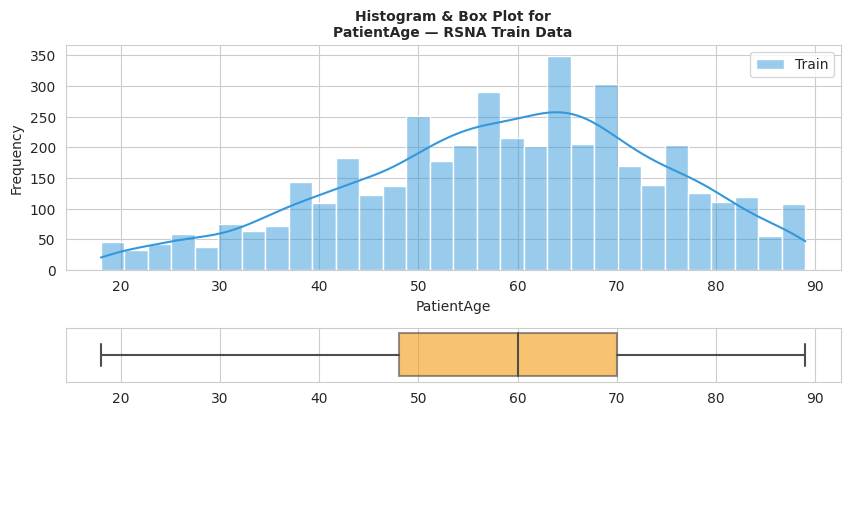

In [10]:
# Suppress warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore", message="Glyph.*missing from current font")

# Copy and label dataset
train_rsna = train_df.copy()
train_rsna['Dataset'] = 'Train'

# Plotting function for single variable in RSNA
def plot_patient_age_distribution(data, column='PatientAge', dataset_label="RSNA Train Data"):
    sns.set_style('whitegrid')

    fig, axes = plt.subplots(
        3, 1,
        figsize=(10, 6),
        gridspec_kw={'height_ratios': [5, 1.2, 1.5], 'hspace': 0.5}
    )

    # Histogram
    ax_hist = axes[0]
    sns.histplot(data=data, x=column, kde=True, bins=30, color=hist_color, ax=ax_hist, label='Train')
    ax_hist.set_xlabel(column)
    ax_hist.set_ylabel("Frequency")
    ax_hist.set_title(
        f"Histogram & Box Plot for\n{column} — {dataset_label}",
        fontweight='bold',
        fontsize=10
    )
    ax_hist.legend()

    # Boxplot
    ax_box = axes[1]
    sns.boxplot(data=data, x=column, palette=[box_color], ax=ax_box, boxprops=dict(facecolor=box_color, alpha=0.6))
    ax_box.set_xlabel("")
    ax_box.set_ylabel("")
    ax_box.set_title("")

    # Spacer row — turn off
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# Run the plot
plot_patient_age_distribution(train_rsna)

# Cleanup
train_rsna.drop('Dataset', axis=1, inplace=True)

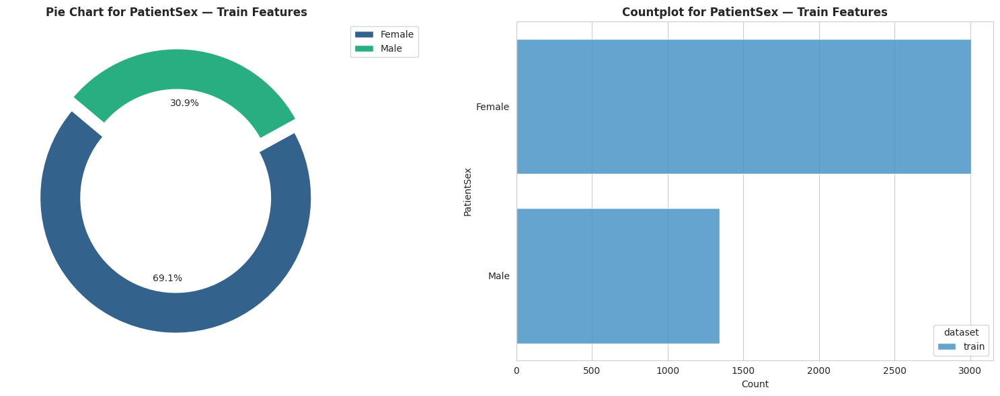

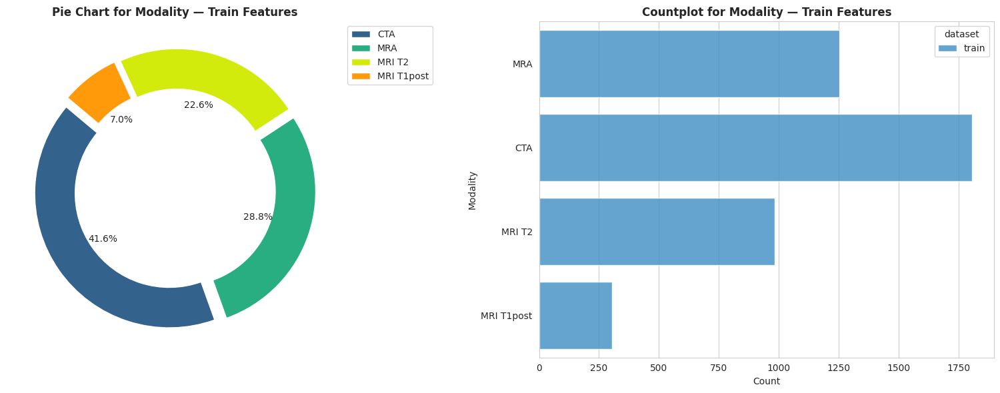

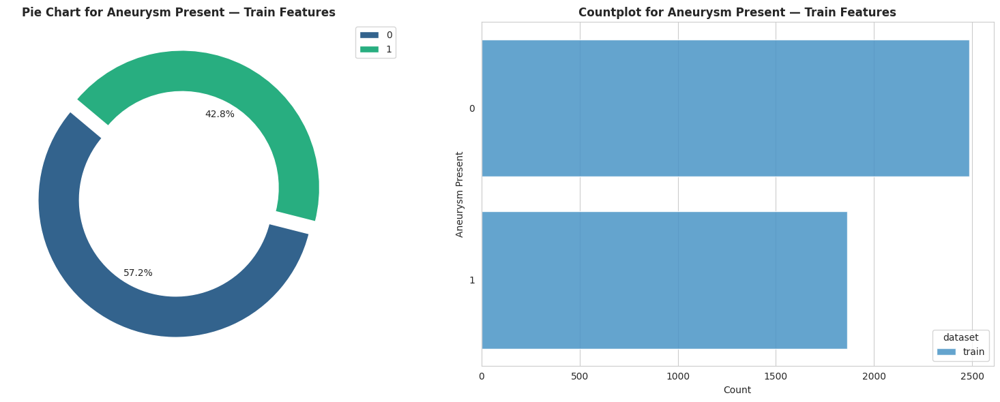

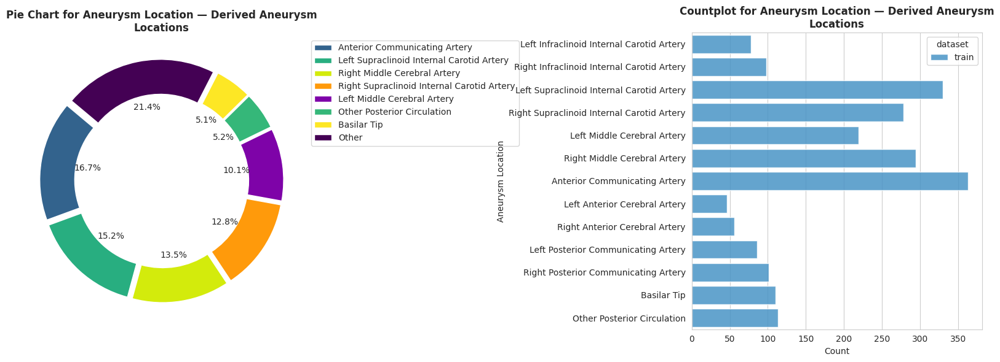

In [11]:
# --- Plotting function (unchanged structure)
def create_categorical_plots(variable, data, source_name):
    sns.set_style('whitegrid')
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Pie Chart
    plt.subplot(1, 2, 1)
    value_counts = data[variable].value_counts()

    # Collapse small categories
    threshold = 0.05 * value_counts.sum()
    filtered_values = value_counts.copy()
    filtered_values[value_counts < threshold] = 0
    filtered_values = filtered_values[filtered_values > 0]
    other_count = value_counts.sum() - filtered_values.sum()
    if other_count > 0:
        filtered_values['Other'] = other_count

    wedges, texts, autotexts = plt.pie(
        filtered_values,
        autopct=lambda p: f'{p:.1f}%' if p > 5 else '',
        colors=pie_chart_palette[:len(filtered_values)],
        startangle=140,
        wedgeprops=dict(width=0.3),
        explode=[0.05 if p > 5 else 0 for p in filtered_values],
        textprops={'fontsize': 10}
    )

    plt.title("\n".join(textwrap.wrap(f"Pie Chart for {variable} — {source_name}", width=50)), fontweight='bold')
    plt.legend(filtered_values.index, loc="upper left", bbox_to_anchor=(1, 1))

    # Countplot
    plt.subplot(1, 2, 2)
    sns.countplot(
        data=data,
        y=variable,
        hue='dataset',
        palette=custom_palette,
        alpha=0.85
    )
    plt.ylabel(variable)
    plt.xlabel("Count")
    plt.title("\n".join(textwrap.wrap(f"Countplot for {variable} — {source_name}", width=50)), fontweight='bold')
    plt.tight_layout()
    plt.show()

# --- Step 1: Prep train_df with categorical columns
train_cats = train_df.copy()
train_cats['dataset'] = 'train'

for var in ['PatientSex', 'Modality', 'Aneurysm Present']:
    create_categorical_plots(var, train_cats, "Train Features")

# Create a long-form dataframe to find where aneurysm is present
aneurysm_location_df = train_df.copy()
aneurysm_location_df['dataset'] = 'train'

# Melt to long form and filter
melted = aneurysm_location_df.melt(
    id_vars=['dataset'],
    value_vars=aneurysm_cols,
    var_name='Aneurysm Location',
    value_name='Presence'
)
melted = melted[melted['Presence'] == 1]  # Only keep positive aneurysm locations

# Plot the derived aneurysm locations
create_categorical_plots('Aneurysm Location', melted, "Derived Aneurysm Locations")

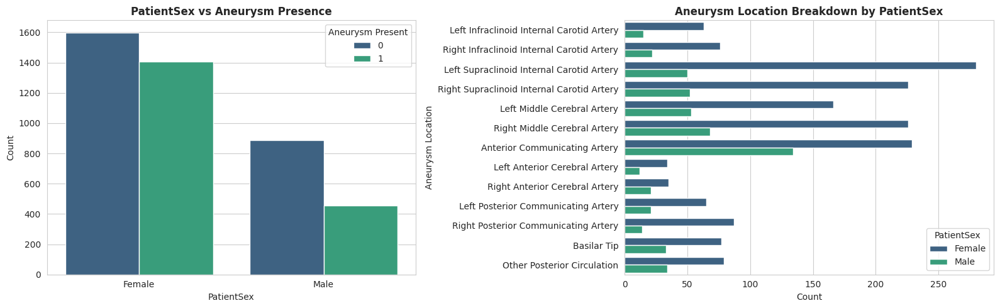

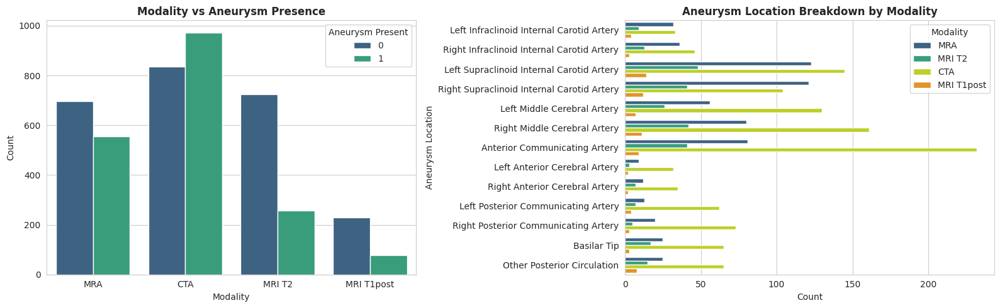

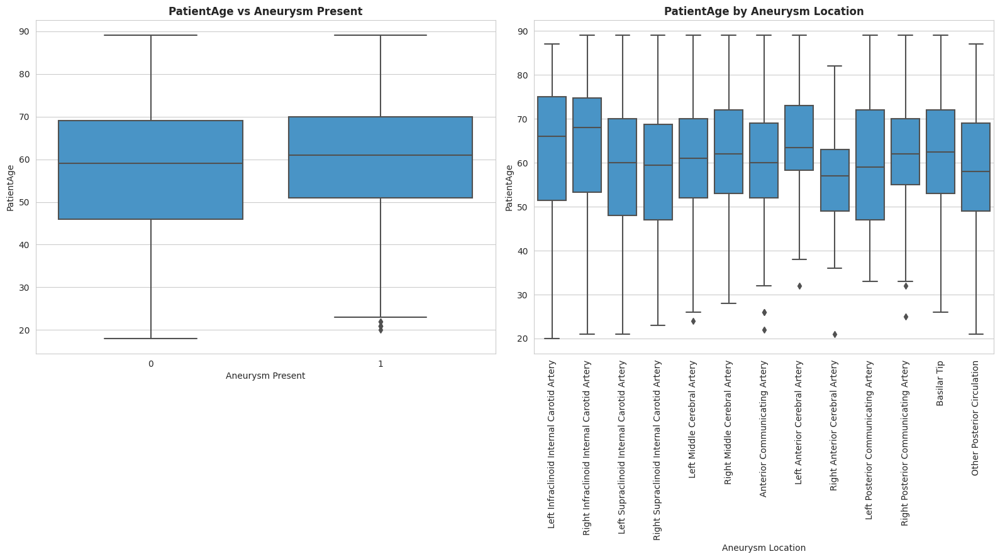

In [12]:
# DataFrame copy
df = train_df.copy()

# Feature definitions
categorical_features = ['PatientSex', 'Modality']
numeric_feature = 'PatientAge'

sns.set_style("whitegrid")

# --- Categorical features: PatientSex and Modality ---
for feature in categorical_features:
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))

    # Left: Aneurysm Present breakdown by feature
    sns.countplot(
        data=df,
        x=feature,
        hue='Aneurysm Present',
        palette=pie_chart_palette[:2],  # 0 and 1
        ax=axes[0]
    )
    axes[0].set_title(f'{feature} vs Aneurysm Presence', fontweight='bold')
    axes[0].set_xlabel(feature)
    axes[0].set_ylabel('Count')

    # Right: Aneurysm locations split by feature
    melted = df.melt(
        id_vars=[feature],
        value_vars=aneurysm_cols,
        var_name='Aneurysm Location',
        value_name='Presence'
    )
    melted = melted[melted['Presence'] == 1]

    unique_vals = df[feature].dropna().unique()
    sns.countplot(
        data=melted,
        y='Aneurysm Location',
        hue=feature,
        palette=pie_chart_palette[:len(unique_vals)],
        ax=axes[1]
    )
    axes[1].set_title(f'Aneurysm Location Breakdown by {feature}', fontweight='bold')
    axes[1].set_xlabel('Count')
    axes[1].set_ylabel('Aneurysm Location')

    plt.tight_layout()
    plt.show()

# --- Numeric feature: PatientAge ---
fig, axes = plt.subplots(1, 2, figsize=(16, 9))  # Height increased here

# Left: Boxplot of Age vs Aneurysm Present
sns.boxplot(
    data=df,
    x='Aneurysm Present',
    y=numeric_feature,
    color=hist_color,
    ax=axes[0]
)
axes[0].set_title('PatientAge vs Aneurysm Present', fontweight='bold')
axes[0].set_xlabel('Aneurysm Present')
axes[0].set_ylabel('PatientAge')

# Right: Boxplot of Age per Aneurysm Location
melted_age = df.melt(
    id_vars=[numeric_feature],
    value_vars=aneurysm_cols,
    var_name='Aneurysm Location',
    value_name='Presence'
)
melted_age = melted_age[melted_age['Presence'] == 1]

sns.boxplot(
    data=melted_age,
    x='Aneurysm Location',
    y=numeric_feature,
    color=hist_color,
    ax=axes[1]
)
axes[1].set_title('PatientAge by Aneurysm Location', fontweight='bold')
axes[1].set_xlabel('Aneurysm Location')
axes[1].set_ylabel('PatientAge')
axes[1].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

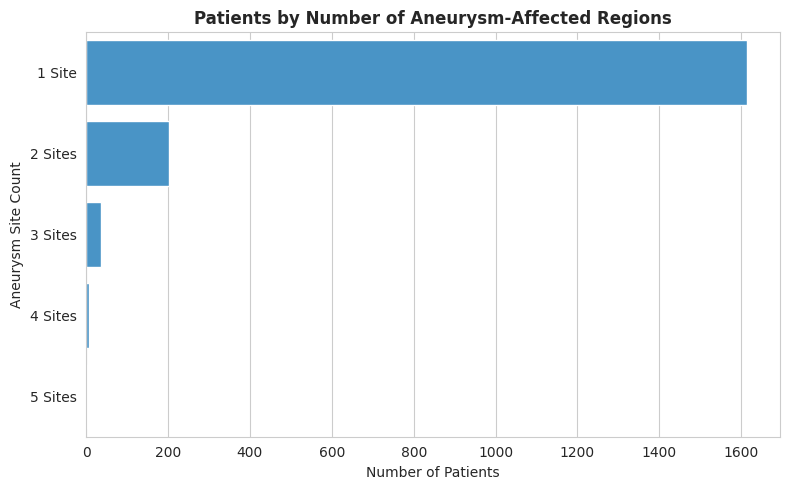

In [13]:
# Count aneurysm-affected regions per patient
train_df['AneurysmCount'] = train_df[aneurysm_cols].sum(axis=1)

# Filter to only patients with at least 1 aneurysm
aneurysm_counts = train_df[train_df['AneurysmCount'] > 0]['AneurysmCount'].value_counts().sort_index()

# Prepare plot-friendly DataFrame
plot_df = aneurysm_counts.reset_index()
plot_df.columns = ['Aneurysm Sites', 'Patient Count']
plot_df['Aneurysm Sites'] = plot_df['Aneurysm Sites'].astype(int).astype(str) + ' Site' + plot_df['Aneurysm Sites'].apply(lambda x: 's' if x > 1 else '')

# Plot
sns.set_style("whitegrid")

plt.figure(figsize=(8, 5))
sns.barplot(
    data=plot_df,
    y='Aneurysm Sites',
    x='Patient Count',
    color=hist_color
)

plt.title("Patients by Number of Aneurysm-Affected Regions", fontweight='bold')
plt.xlabel("Number of Patients")
plt.ylabel("Aneurysm Site Count")
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

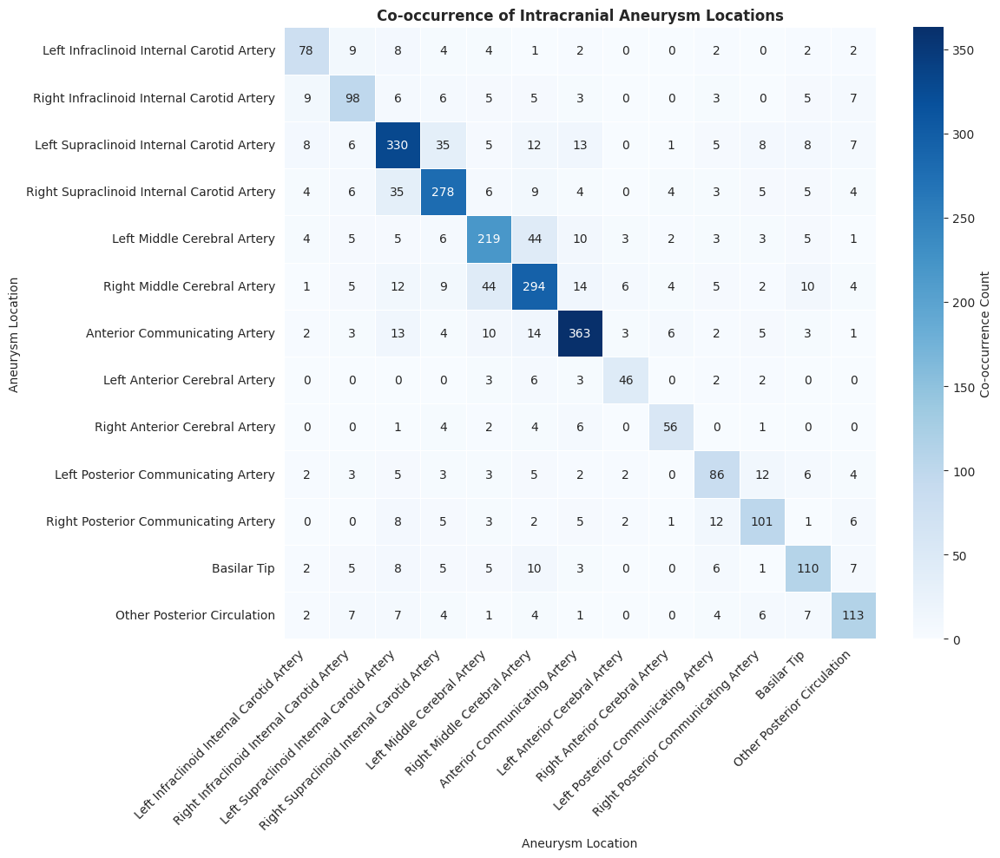

In [14]:
# Each cell [i, j] = number of scans in which both location i AND location j have an aneurysm
co_occurrence_matrix = train_df[aneurysm_cols].T.dot(train_df[aneurysm_cols])

# Plot as a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(
    co_occurrence_matrix,
    annot=True,
    fmt='d',               # integer format
    cmap='Blues',
    linewidths=0.5,
    cbar_kws={'label': 'Co-occurrence Count'}
)
plt.title('Co-occurrence of Intracranial Aneurysm Locations', weight='bold')
plt.xlabel('Aneurysm Location')
plt.ylabel('Aneurysm Location')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### **localizers_df (train_localizers.csv)**

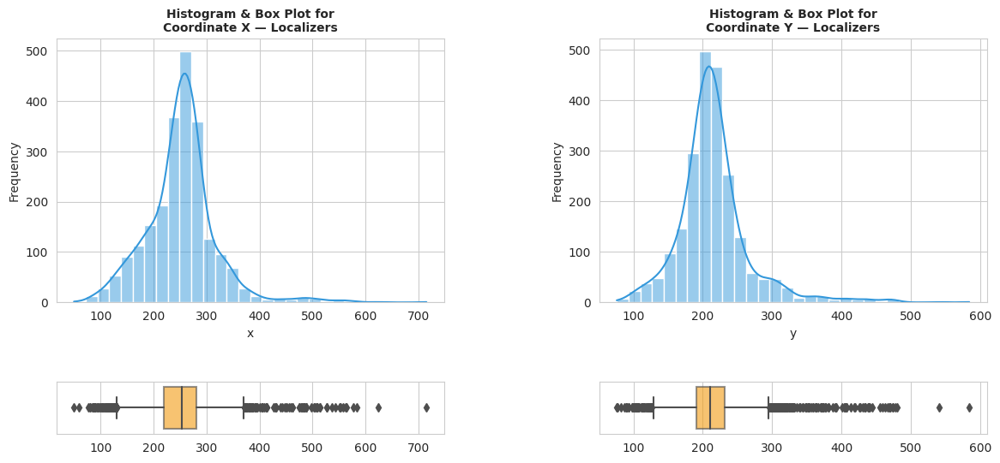

In [15]:
# Step 1: Safe copy
localizers_temp = localizers_df.copy()

# Step 2: Parse stringified dict and extract x and y
localizers_temp['parsed_coordinates'] = localizers_temp['coordinates'].apply(ast.literal_eval)
localizers_temp['x'] = localizers_temp['parsed_coordinates'].apply(lambda d: d.get('x'))
localizers_temp['y'] = localizers_temp['parsed_coordinates'].apply(lambda d: d.get('y'))
localizers_temp['Dataset'] = 'Localizers'

# Fonction pour tracer un seul graphique (histogramme + boxplot)
def plot_single_coordinate_distribution(data, column, ax_hist, ax_box, title, hist_color, box_color):
    sns.histplot(data=data, x=column, kde=True, bins=30, color=hist_color, ax=ax_hist)
    ax_hist.set_xlabel(column)
    ax_hist.set_ylabel("Frequency")
    ax_hist.set_title(title, fontweight='bold', fontsize=10)

    sns.boxplot(data=data, x=column, palette=[box_color], ax=ax_box, boxprops=dict(facecolor=box_color, alpha=0.6))
    ax_box.set_xlabel("")
    ax_box.set_ylabel("")

# Créer une figure avec 2 colonnes (pour X et Y)
fig, axes = plt.subplots(
    2, 2,
    figsize=(14, 6),
    gridspec_kw={'height_ratios': [5, 1], 'width_ratios': [1, 1], 'hspace': 0.5, 'wspace': 0.4}
)

# Tracer pour X (colonne 0)
plot_single_coordinate_distribution(
    localizers_temp, 'x',
    ax_hist=axes[0, 0], ax_box=axes[1, 0],
    title="Histogram & Box Plot for\nCoordinate X — Localizers",
    hist_color=hist_color, box_color=box_color
)


plot_single_coordinate_distribution(
    localizers_temp, 'y',
    ax_hist=axes[0, 1], ax_box=axes[1, 1],
    title="Histogram & Box Plot for\nCoordinate Y — Localizers",
    hist_color=hist_color, box_color=box_color
)

plt.tight_layout()
plt.show()

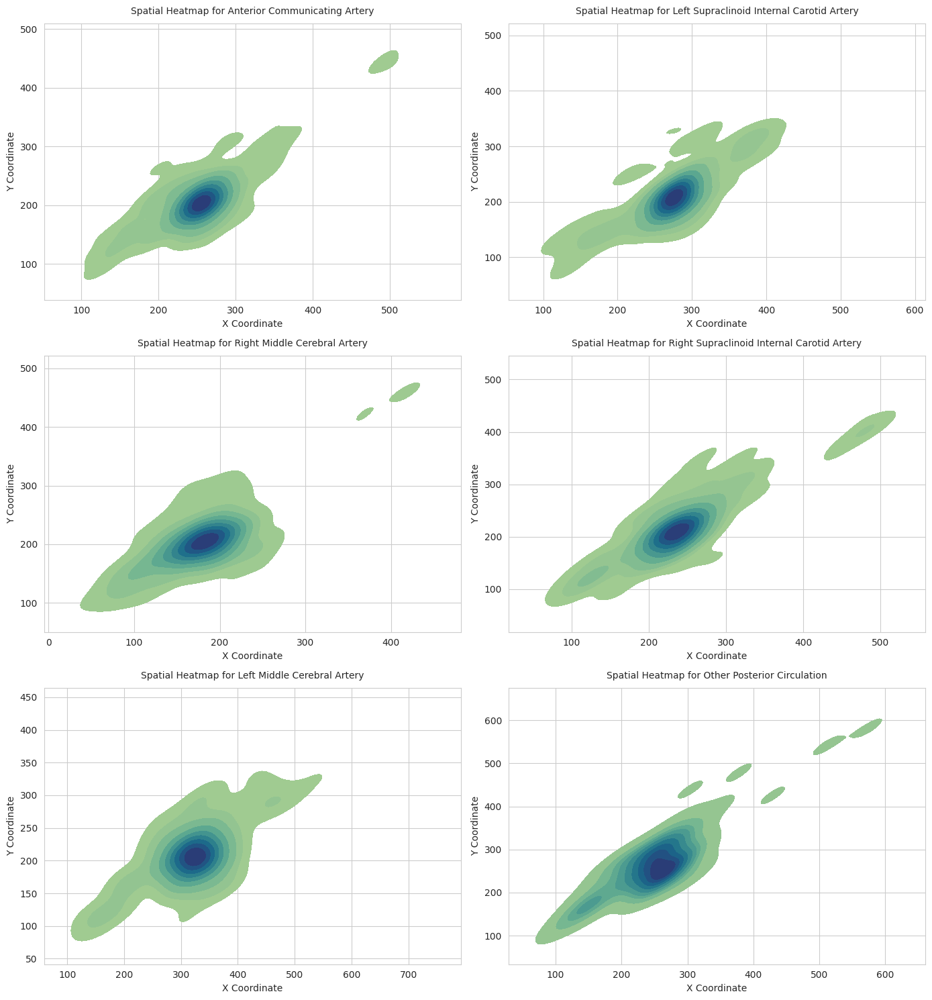

In [16]:
# Parse coordinates
localizers_df["coord_dict"] = localizers_df["coordinates"].apply(ast.literal_eval)
localizers_df["x"] = localizers_df["coord_dict"].apply(lambda d: d["x"])
localizers_df["y"] = localizers_df["coord_dict"].apply(lambda d: d["y"])

# Top 6 most frequent locations
top_locations = localizers_df["location"].value_counts().head(6).index

# Créer une grille de 3 lignes × 2 colonnes
fig, axes = plt.subplots(
    nrows=3,
    ncols=2,
    figsize=(14, 15),  # Largeur × Hauteur
    tight_layout=True
)

# Aplatir les axes pour un accès facile
axes = axes.flatten()

# Plot heatmap per location
for i, loc in enumerate(top_locations):
    subset = localizers_df[localizers_df["location"] == loc]
    ax = axes[i]
    sns.kdeplot(
        data=subset,
        x="x",
        y="y",
        fill=True,
        cmap="crest",
        ax=ax
    )
    ax.set_title(f"Spatial Heatmap for {loc}", fontsize=10, pad=10)
    ax.set_xlabel("X Coordinate")
    ax.set_ylabel("Y Coordinate")

# Masquer les axes inutilisés (si moins de 6 localisations)
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

### **series**

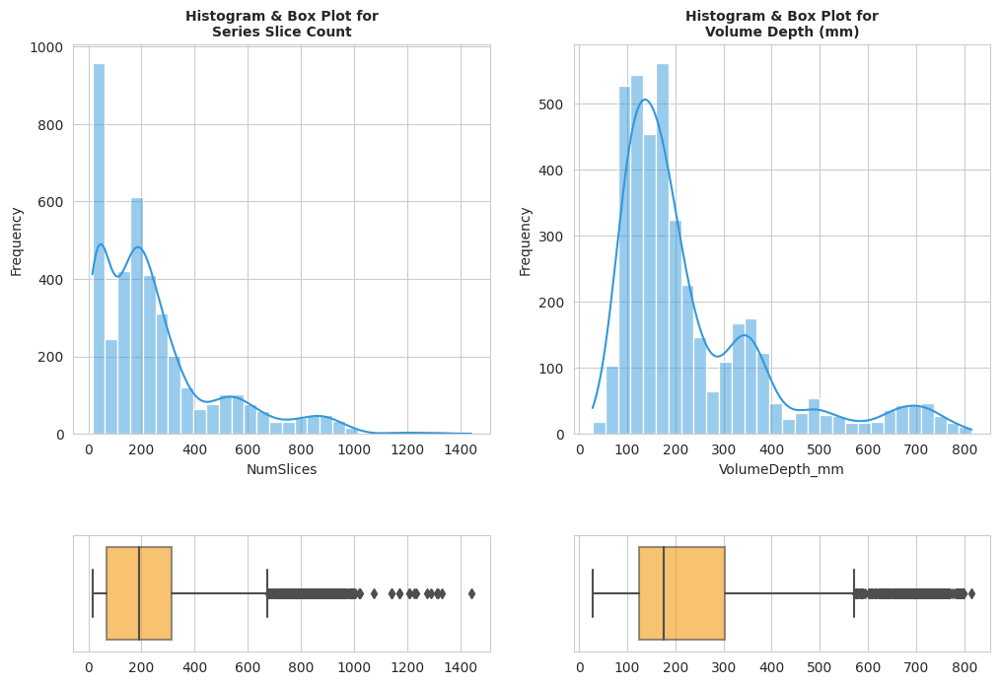

In [17]:
# Suppress warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

sns.set_style("whitegrid")

# --- Build DataFrame with NumSlices and VolumeDepth_mm
series_stats = []
for sid in os.listdir(dicom_dir):
    series_path = os.path.join(dicom_dir, sid)
    if not os.path.isdir(series_path):
        continue
    files = sorted(os.listdir(series_path))
    if not files:
        continue
    num_slices = len(files)

    # read one DICOM for thickness
    try:
        ds = pydicom.dcmread(os.path.join(series_path, files[0]), stop_before_pixels=True)
        st = float(ds.SliceThickness) if 'SliceThickness' in ds else None
    except:
        st = None

    series_stats.append({
        "NumSlices": num_slices,
        "VolumeDepth_mm": num_slices * st if st else None
    })

stats_df = pd.DataFrame(series_stats).dropna()

# --- Plot both features in a 2×2 grid (no spacer)
fig, axes = plt.subplots(
    2, 2,
    figsize=(12, 8),
    gridspec_kw={'height_ratios': [5, 1.5], 'hspace': 0.4}
)

features = ["NumSlices", "VolumeDepth_mm"]
titles   = ["Series Slice Count", "Volume Depth (mm)"]

for col_idx, feature in enumerate(features):
    # Histogram row
    ax_hist = axes[0, col_idx]
    sns.histplot(
        data=stats_df,
        x=feature,
        kde=True,
        bins=30,
        color=hist_color,
        ax=ax_hist
    )
    ax_hist.set_title(f"Histogram & Box Plot for\n{titles[col_idx]}", fontweight='bold', fontsize=10)
    ax_hist.set_xlabel(feature)
    ax_hist.set_ylabel("Frequency")

    # Boxplot row
    ax_box = axes[1, col_idx]
    sns.boxplot(
        data=stats_df,
        x=feature,
        color=box_color,
        ax=ax_box,
        boxprops=dict(facecolor=box_color, alpha=0.6)
    )
    ax_box.set_xlabel("")
    ax_box.set_ylabel("")

plt.tight_layout()
plt.show()

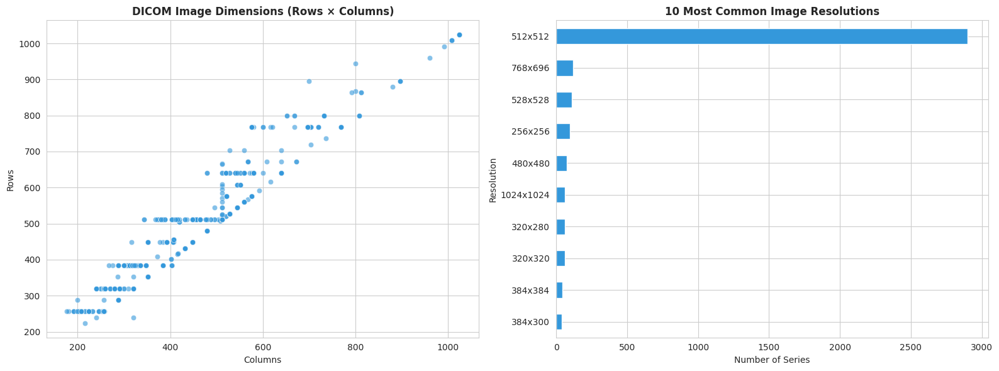

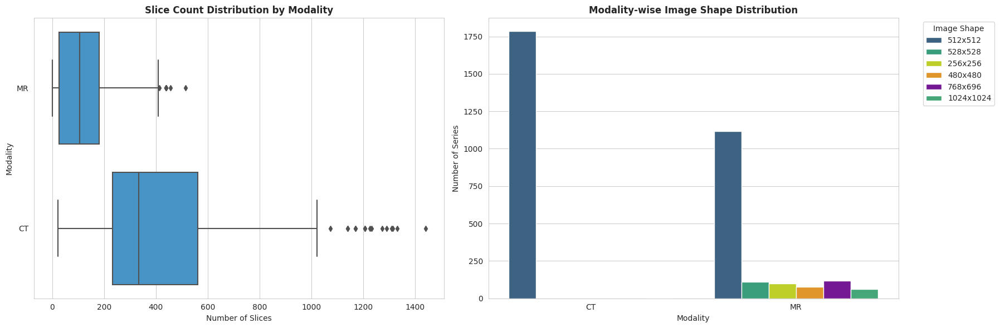

In [18]:
# --- Extract DICOM shape info (non-destructive)
shape_data = []
for sid in os.listdir(dicom_dir):
    path = os.path.join(dicom_dir, sid)
    files = os.listdir(path)
    if files:
        dcm = pydicom.dcmread(os.path.join(path, files[0]), stop_before_pixels=True)
        shape_data.append({
            'SeriesInstanceUID': sid,
            'Rows': dcm.Rows,
            'Columns': dcm.Columns,
            'Shape': f"{dcm.Rows}x{dcm.Columns}"
        })

shape_df = pd.DataFrame(shape_data)

# --- Count for top shapes
top_shapes = shape_df['Shape'].value_counts().nlargest(10)

# --- Plotting
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Left: Scatter plot of all (Rows, Columns)
sns.scatterplot(
    data=shape_df,
    x='Columns',
    y='Rows',
    color=hist_color,
    alpha=0.6,
    ax=axes[0]
)
axes[0].set_title("DICOM Image Dimensions (Rows × Columns)", fontweight='bold')
axes[0].set_xlabel("Columns")
axes[0].set_ylabel("Rows")
axes[0].grid(True)

# Right: Bar chart of top 6 common resolutions
top_shapes.sort_values().plot(
    kind='barh',
    color=hist_color,
    ax=axes[1]
)
axes[1].set_title("10 Most Common Image Resolutions", fontweight='bold')
axes[1].set_xlabel("Number of Series")
axes[1].set_ylabel("Resolution")

plt.tight_layout()
plt.show()



# --- Step 1: Gather modality, shape, and slice info
modality_data = []
for sid in os.listdir(dicom_dir):
    path = os.path.join(dicom_dir, sid)
    files = os.listdir(path)
    if files:
        dcm = pydicom.dcmread(os.path.join(path, files[0]), stop_before_pixels=True)
        modality = dcm.Modality if 'Modality' in dcm else 'Unknown'
        shape = f"{dcm.Rows}x{dcm.Columns}"
        modality_data.append({
            'SeriesInstanceUID': sid,
            'Modality': modality,
            'Shape': shape,
            'NumSlices': len(files)
        })

modality_df = pd.DataFrame(modality_data)

# --- Filter: Top 6 shapes only
top_shapes = modality_df['Shape'].value_counts().nlargest(6).index
modality_df_filtered = modality_df[modality_df['Shape'].isin(top_shapes)]

# --- Plotting side-by-side
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Left: Boxplot of NumSlices by Modality (horizontal)
sns.boxplot(
    data=modality_df,
    y='Modality',
    x='NumSlices',
    color=hist_color,
    ax=axes[0]
)
axes[0].set_title("Slice Count Distribution by Modality", fontweight='bold')
axes[0].set_xlabel("Number of Slices")
axes[0].set_ylabel("Modality")

# Right: Countplot of Modality vs Shape
sns.countplot(
    data=modality_df_filtered,
    x='Modality',
    hue='Shape',
    palette=pie_chart_palette[:len(top_shapes)],
    ax=axes[1]
)
axes[1].set_title("Modality-wise Image Shape Distribution", fontweight='bold')
axes[1].set_xlabel("Modality")
axes[1].set_ylabel("Number of Series")
axes[1].legend(title='Image Shape', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

# <span style="color:#ffffff; font-size: 1%;">III - Data Visualization</span>
### <span style="color:#ffffff; font-size: 1%;">EDA</span>

<div style=" border-bottom: 8px solid #1E88E5; overflow: hidden; border-radius: 10px; height: 45px; width: 100%; display: flex;">
  <div style="height: 100%; width: 100%; background-color: #E6F0FA; float: left; text-align: center; display: flex; justify-content: center; align-items: center; font-size: 25px; ">
    <b><span style="color:#1E88E5; padding: 20px 20px;"><strong>III - Data Visualization</strong></span></b>
  </div></div>

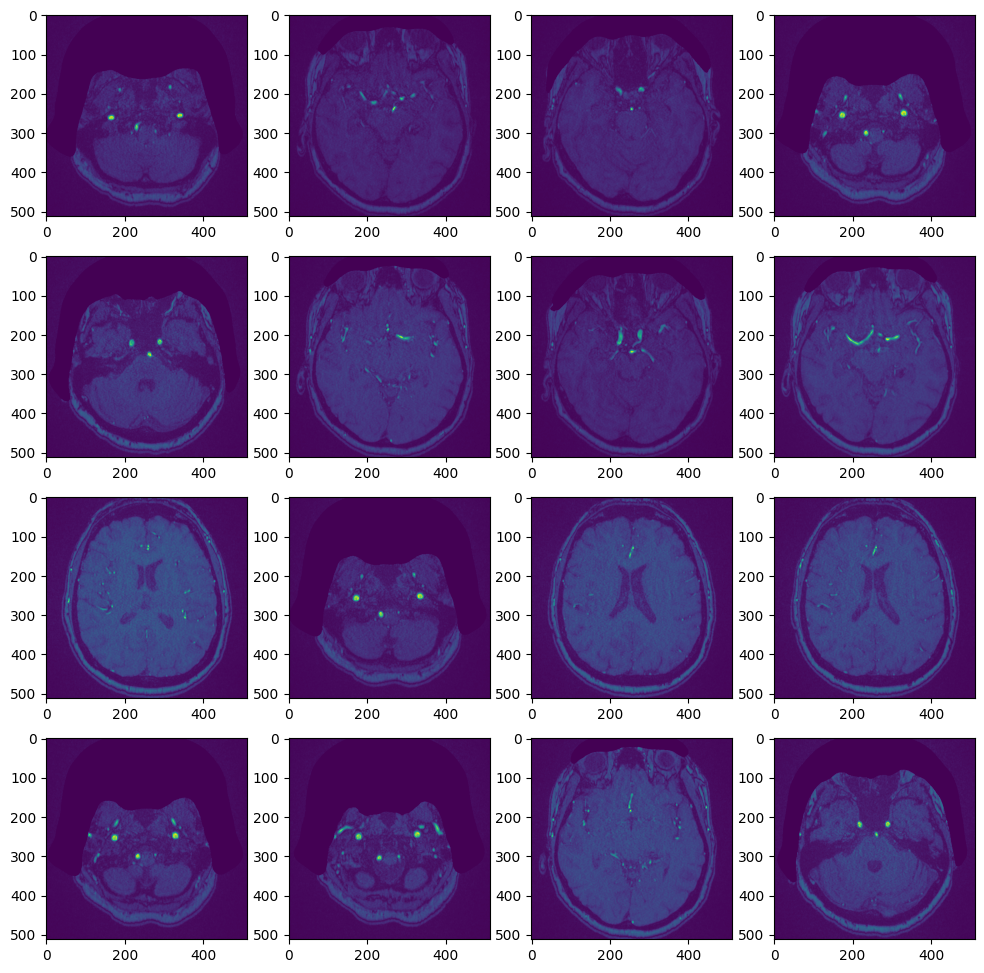

In [19]:
train_images = glob("/kaggle/input/rsna-intracranial-aneurysm-detection/series/1.2.826.0.1.3680043.8.498.10004044428023505108375152878107656647/*")

plt.style.use('default')
fig, axes = plt.subplots(4,4, figsize=(12,12))
train_images
for i, ax in enumerate(axes.reshape(-1)):
    img_path = train_images[i]
    img = pydicom.dcmread(img_path)  
    ax.imshow(img.pixel_array)
plt.show()

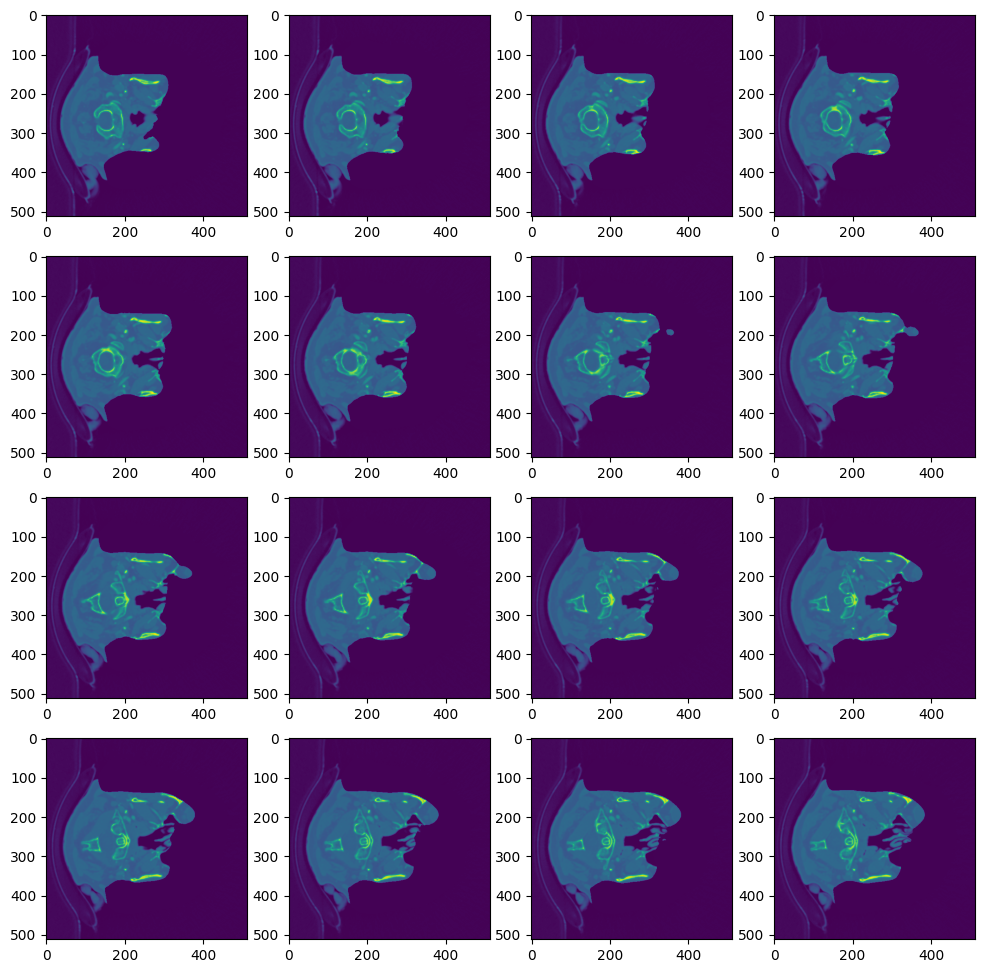

In [20]:
path = '/kaggle/input/rsna-intracranial-aneurysm-detection/segmentations/1.2.826.0.1.3680043.8.498.10035643165968342618460849823699311381.nii'

img = nib.load(path).get_fdata()
plt.style.use('default')
fig, axes = plt.subplots(4,4, figsize=(12,12))
for i, ax in enumerate(axes.reshape(-1)):
    ax.imshow(img[:,:,1 + i])
plt.show()

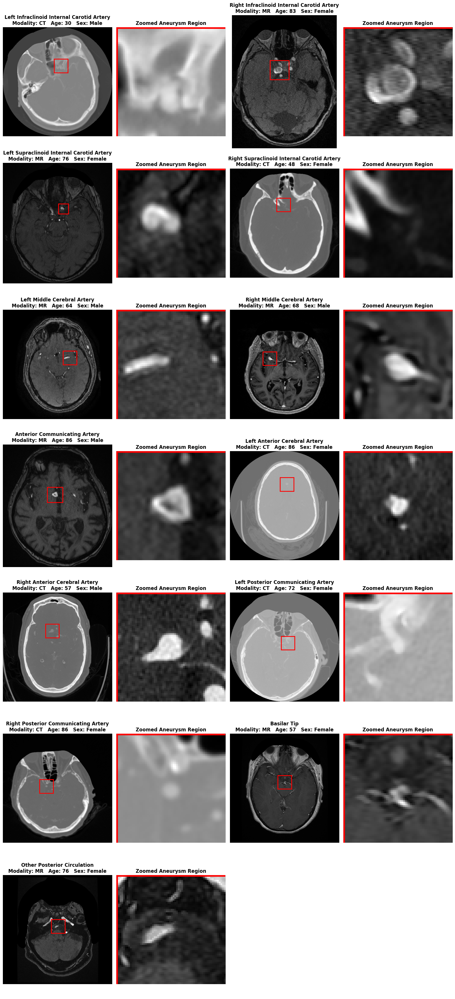

In [21]:
# Pick one random valid example per region
examples = {}
for region in aneurysm_cols:
    sids = train_df.loc[train_df[region] == 1, 'SeriesInstanceUID'].unique().tolist()
    random.shuffle(sids)
    for sid in sids:
        series_path = os.path.join(dicom_dir, sid)
        if not os.path.isdir(series_path):
            continue
        loc = localizers_df[
            (localizers_df.SeriesInstanceUID == sid) &
            (localizers_df.location == region)
        ]
        if loc.empty:
            continue
        examples[region] = {
            'SeriesInstanceUID': sid,
            'localizer': loc.sample(1).iloc[0]
        }
        break

# Setup grid: 2 regions per row → 4 columns
regions = list(examples.items())
n = len(regions)
rows = int(np.ceil(n / 2))

fig, axes = plt.subplots(rows, 4, figsize=(16, 5 * rows))
if rows == 1:
    axes = axes[np.newaxis, :]

for idx, (region, info) in enumerate(regions):
    row = idx // 2
    col_offset = (idx % 2) * 2

    sid     = info['SeriesInstanceUID']
    loc_row = info['localizer']
    coords  = ast.literal_eval(loc_row['coordinates'])
    x, y    = int(coords['x']), int(coords['y'])
    sop_uid = loc_row['SOPInstanceUID']

    # Metadata
    meta = train_df.loc[train_df['SeriesInstanceUID'] == sid].iloc[0]
    age, sex = meta['PatientAge'], meta['PatientSex']

    # Load slice
    files = sorted(os.listdir(os.path.join(dicom_dir, sid)))
    dcm_file = next(f for f in files if f.startswith(sop_uid))
    ds = pydicom.dcmread(os.path.join(dicom_dir, sid, dcm_file))
    img = ds.pixel_array
    if img.ndim == 3:
        img = img[0]
    modality = ds.Modality

    # Compute box
    half = 32
    xmin = max(x - half, 0)
    ymin = max(y - half, 0)
    box_w = min(2*half, img.shape[1] - xmin)
    box_h = min(2*half, img.shape[0] - ymin)

    # Full slice
    ax_full = axes[row, col_offset]
    ax_full.imshow(img, cmap='gray')
    ax_full.add_patch(Rectangle((xmin, ymin), box_w, box_h,
                                edgecolor='red', linewidth=2, fill=False))
    ax_full.set_title(
        f"{region}\nModality: {modality}   Age: {age}   Sex: {sex}",
        fontweight='bold', loc='center'
    )
    ax_full.axis('off')

    # Zoom
    zoom = img[ymin:ymin+box_h, xmin:xmin+box_w]
    ax_zoom = axes[row, col_offset + 1]
    ax_zoom.imshow(zoom, cmap='gray')
    # Ensure border is drawn last
    rect = Rectangle((0, 0), zoom.shape[1], zoom.shape[0],
                     edgecolor='red', linewidth=4, fill=False, zorder=10)
    ax_zoom.add_patch(rect)
    ax_zoom.set_title("Zoomed Aneurysm Region", fontweight='bold', loc='center')
    ax_zoom.axis('off')

# Hide any unused axes
total_plots = rows * 4
for empty_idx in range(n*2, total_plots):
    r = empty_idx // 4
    c = empty_idx % 4
    axes[r, c].axis('off')

plt.tight_layout()
plt.show()

Trying series: 1.2.826.0.1.3680043.8.498.13357449270526786778229685454362408924
Successfully loaded series: 1.2.826.0.1.3680043.8.498.13357449270526786778229685454362408924
Loaded CT volume with 51 slices
Patient Age: 060Y, Sex: F



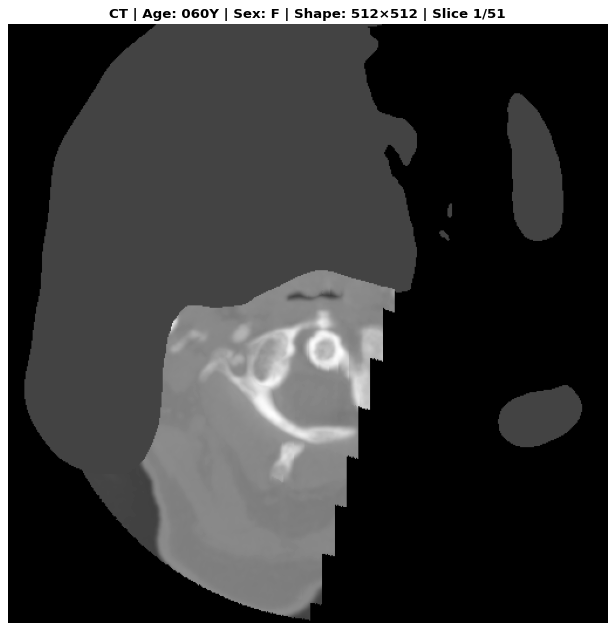
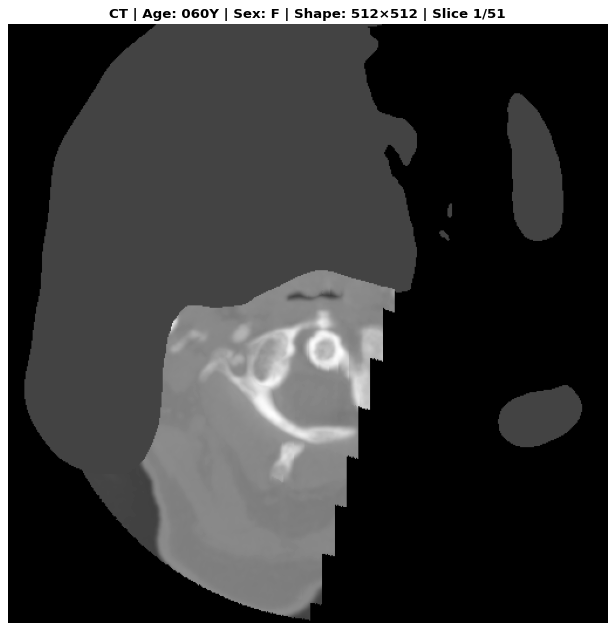
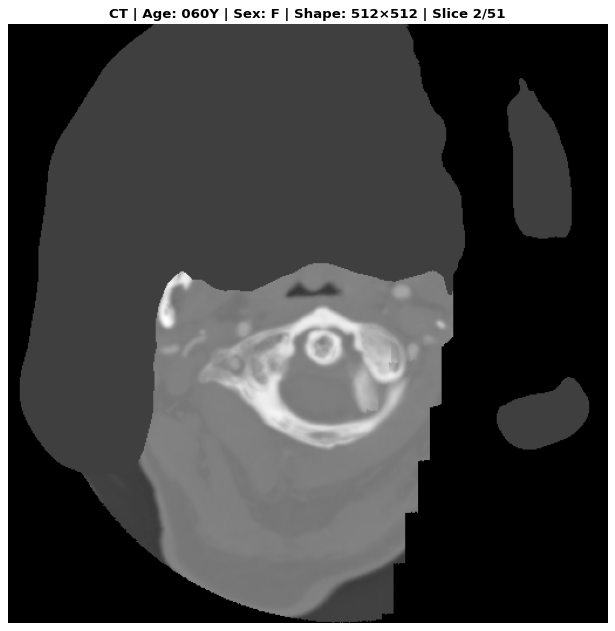
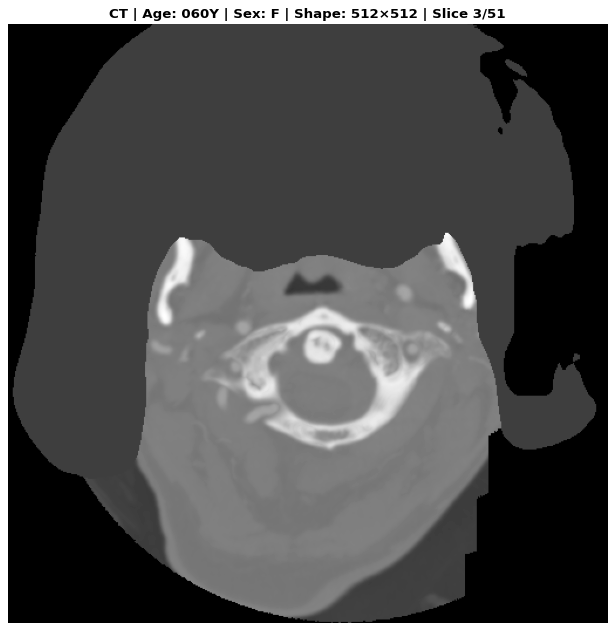
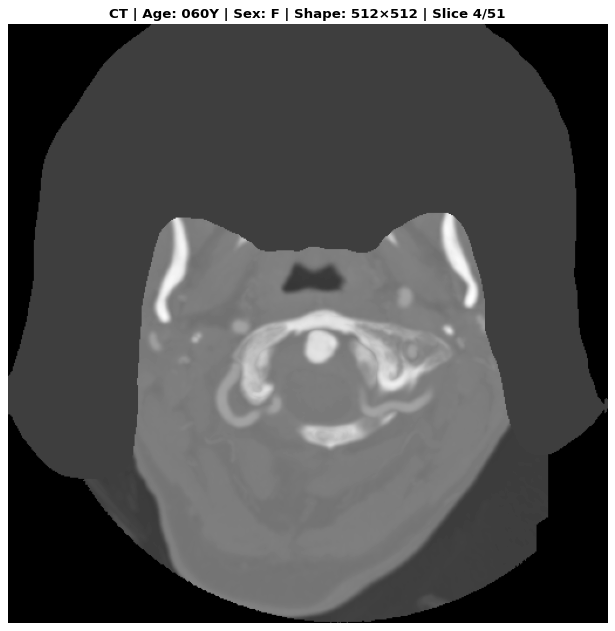
...
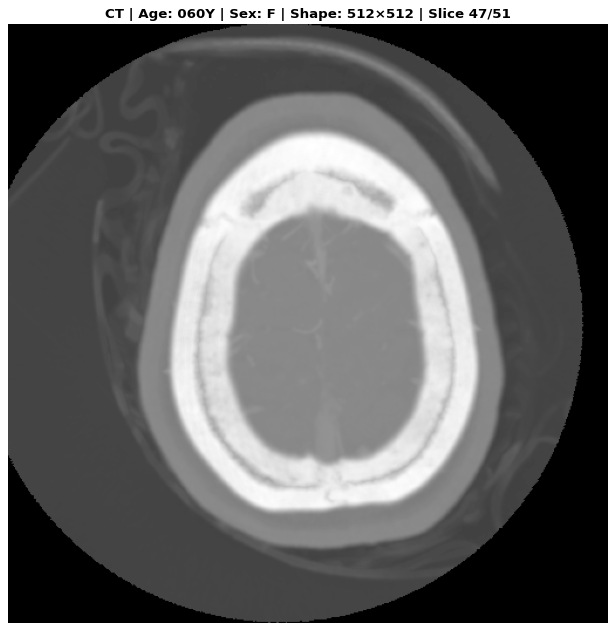
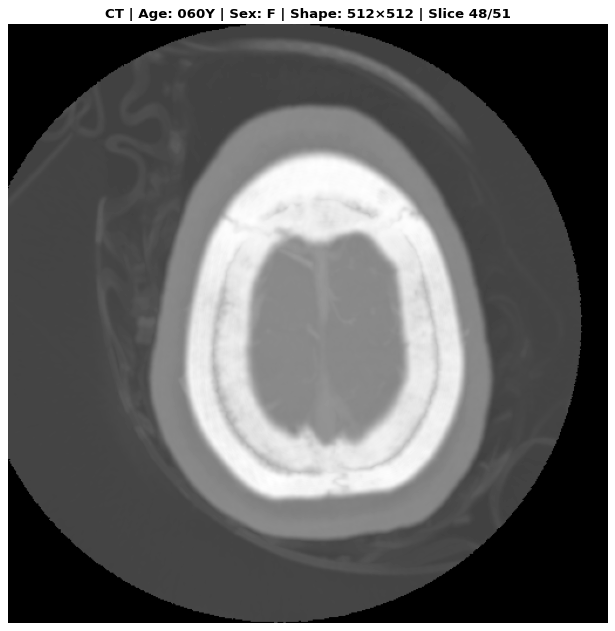
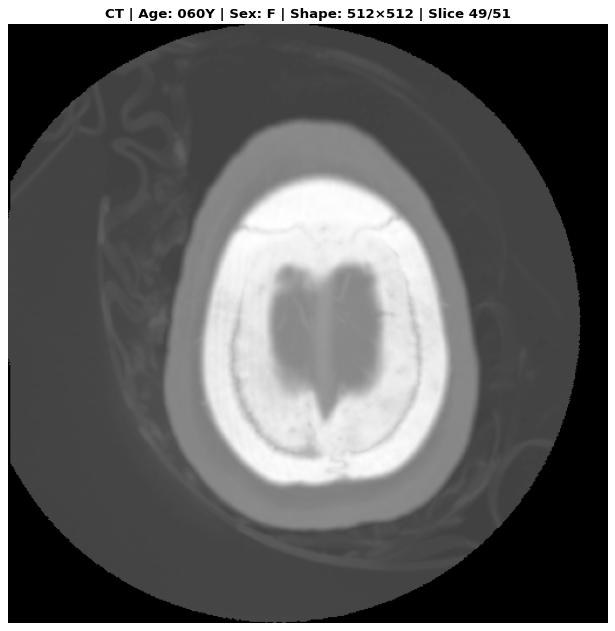
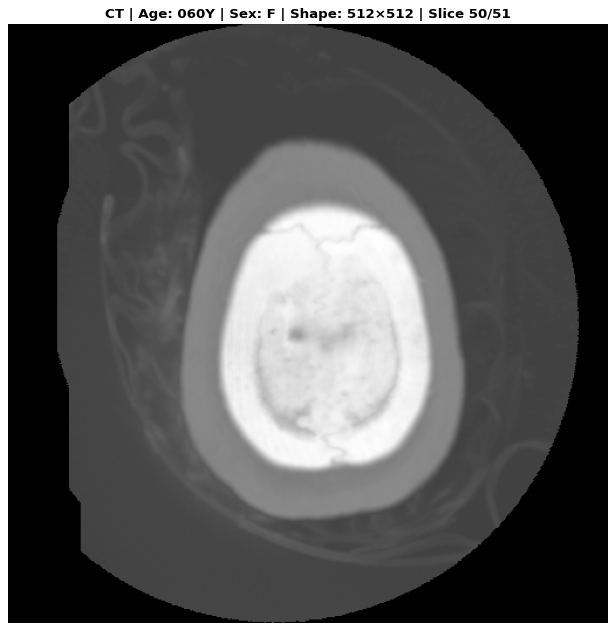
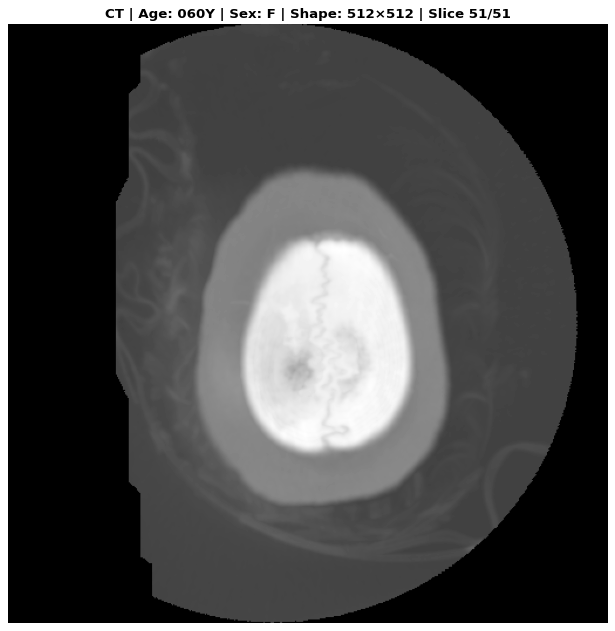

In [22]:
# --- Helper to load full DICOM volume
def load_dicom_volume(series_path):
    try:
        files = sorted(os.listdir(series_path), key=lambda f: pydicom.dcmread(os.path.join(series_path, f)).InstanceNumber)
        slices = []
        for f in files:
            dcm = pydicom.dcmread(os.path.join(series_path, f))
            img = dcm.pixel_array
            if img.ndim == 3:  # multi-frame
                img = img[0]
            slices.append(img)
        return np.stack(slices), dcm  # return last ds for metadata
    except Exception as e:
        print(f"Error loading series: {e}")
        return None, None

# --- Select one random valid series
valid_sids = [sid for sid in os.listdir(dicom_dir) if os.path.isdir(os.path.join(dicom_dir, sid))]
random.shuffle(valid_sids)

volume, meta = None, None
for sid in valid_sids:
    try:
        print(f"Trying series: {sid}")
        volume, meta = load_dicom_volume(os.path.join(dicom_dir, sid))
        if volume is not None and volume.shape[0] >= 5:  # filter for actual 3D volumes
            print(f"Successfully loaded series: {sid}")
            break
    except Exception as e:
        print(f"Error with series {sid}: {e}")
        continue

if volume is None:
    print("⚠️ No valid DICOM series found.")
else:
    # --- Metadata
    modality = getattr(meta, 'Modality', 'Unknown')
    age = getattr(meta, 'PatientAge', 'N/A')
    sex = getattr(meta, 'PatientSex', 'N/A')
    shape = f"{volume.shape[1]}×{volume.shape[2]}"
    num_slices = volume.shape[0]
    
    print(f"Loaded {modality} volume with {num_slices} slices")
    print(f"Patient Age: {age}, Sex: {sex}")
    
    # --- Normalize pixel values for better visualization
    volume_min = volume.min()
    volume_max = volume.max()
    if volume_max > volume_min:
        normalized_volume = (volume - volume_min) / (volume_max - volume_min)
    else:
        normalized_volume = volume
    
    # --- Create images for each slice and convert to base64
    # Limit to a reasonable number of slices to avoid browser performance issues
    max_slices = min(num_slices, 100)  # Limit to 100 slices max
    step = max(1, num_slices // max_slices)
    
    base64_images = []
    for i in range(0, num_slices, step):
        plt.figure(figsize=(8, 8), dpi=80)
        plt.imshow(normalized_volume[i], cmap='gray')
        plt.axis('off')
        plt.title(f"{modality} | Age: {age} | Sex: {sex} | Shape: {shape} | Slice {i+1}/{num_slices}", 
                 fontsize=12, fontweight='bold')
        plt.tight_layout()
        
        # Convert plot to base64 string
        buffer = BytesIO()
        plt.savefig(buffer, format='png', bbox_inches='tight')
        buffer.seek(0)
        img_str = base64.b64encode(buffer.read()).decode('utf-8')
        base64_images.append(img_str)
        plt.close()
    
    # --- Create HTML with embedded JavaScript slider
    html_content = f"""
    <div style="text-align:center; max-width:800px; margin:0 auto;">
        <div style="margin-bottom:10px;">
            <img id="sliceImage" src="data:image/png;base64,{base64_images[0]}" 
                 style="max-width:100%; height:auto; border:1px solid #ddd;">
        </div>
        <div style="margin:10px 0;">
            <input type="range" id="sliceSlider" min="0" max="{len(base64_images)-1}" value="0" 
                   style="width:80%; margin:0 auto;">
            <div id="sliceLabel" style="margin-top:5px; font-weight:bold;">
                Slice 1/{len(base64_images)}
            </div>
        </div>
        <div style="margin:10px 0;">
            <button id="playButton" style="padding:5px 15px;">▶️ Play</button>
            <button id="stopButton" style="padding:5px 15px; margin-left:10px;">⏹️ Stop</button>
        </div>
    </div>
    
    <script>
        // Store images in a JavaScript array
        const images = [];
        {' '.join([f"images.push('data:image/png;base64,{img}');" for img in base64_images])}
        
        // Get elements
        const slider = document.getElementById('sliceSlider');
        const image = document.getElementById('sliceImage');
        const label = document.getElementById('sliceLabel');
        const playButton = document.getElementById('playButton');
        const stopButton = document.getElementById('stopButton');
        
        // Update image when slider changes
        slider.oninput = function() {{
            const index = parseInt(this.value);
            image.src = images[index];
            label.textContent = `Slice ${{index*{step}+1}}/${{images.length*{step}}}`;
        }};
        
        // Animation variables
        let animationId = null;
        let currentIndex = 0;
        
        // Play function
        function playSlides() {{
            if (animationId) return; // Already playing
            
            animationId = setInterval(() => {{
                currentIndex = (currentIndex + 1) % images.length;
                slider.value = currentIndex;
                image.src = images[currentIndex];
                label.textContent = `Slice ${{currentIndex*{step}+1}}/${{images.length*{step}}}`;
            }}, 200); // Change slice every 200ms
        }}
        
        // Stop function
        function stopSlides() {{
            if (animationId) {{
                clearInterval(animationId);
                animationId = null;
            }}
        }}
        
        // Add event listeners
        playButton.onclick = playSlides;
        stopButton.onclick = stopSlides;
    </script>
    """
    
    # Display the HTML
    display(HTML(html_content))